In [269]:
import numpy as np
import pandas as pd
import scipy.stats
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

In [270]:
df = pd.read_csv('Result_Emax_glucosidase_posthoc_dunn.csv')

In [271]:
df

,Unnamed: 0,chi2,Z,P,P.adjusted,comparitor_1,comparitor_2
0,1,91.234203,1.694131,0.05,0.05,A_marginata,A_pulchellus
1,2,91.234203,1.149589,0.13,0.13,A_marginata,A_vanprukii
2,3,91.234203,-0.544542,0.29,0.29,A_pulchellus,A_vanprukii
3,4,91.234203,-0.461348,0.32,0.32,A_marginata,B_anceps
4,5,91.234203,-2.155480,0.02,0.02,A_pulchellus,B_anceps
...,...,...,...,...,...,...,...
460,461,91.234203,-1.247909,0.11,0.11,R_dumetorum,T_triptera
461,462,91.234203,0.877318,0.19,0.19,R_javanica,T_triptera
462,463,91.234203,-0.257145,0.40,0.40,R_succedanea,T_triptera
463,464,91.234203,-0.952949,0.17,0.17,T_loureiri,T_triptera


In [272]:
df = df[['comparitor_1', 'comparitor_2','Z','P']]

In [273]:
df

,comparitor_1,comparitor_2,Z,P
0,A_marginata,A_pulchellus,1.694131,0.05
1,A_marginata,A_vanprukii,1.149589,0.13
2,A_pulchellus,A_vanprukii,-0.544542,0.29
3,A_marginata,B_anceps,-0.461348,0.32
4,A_pulchellus,B_anceps,-2.155480,0.02
...,...,...,...,...
460,R_dumetorum,T_triptera,-1.247909,0.11
461,R_javanica,T_triptera,0.877318,0.19
462,R_succedanea,T_triptera,-0.257145,0.40
463,T_loureiri,T_triptera,-0.952949,0.17


In [274]:
#remove self correlations
df = df.loc[df['comparitor_1'] != df['comparitor_2']].copy()

In [275]:
#create undirected graph with weights corresponding to the correlation magnitude
G0 = nx.from_pandas_edgelist(df, 'comparitor_1', 'comparitor_2', edge_attr=['P'])

#print out the graph info
#check number of nodes and degrees are as expected (all should have degree = 38, i.e. average degree = 38)
print(nx.info(G0))

Graph with 31 nodes and 465 edges


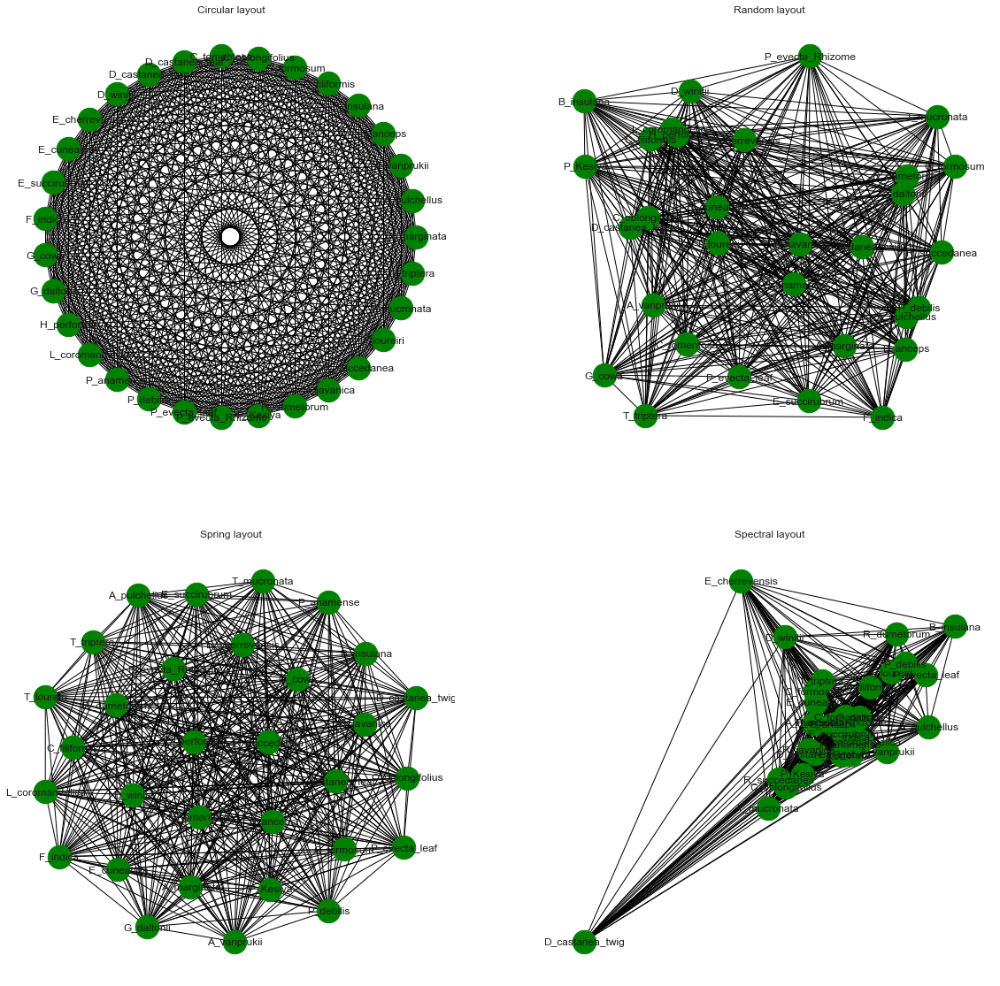

In [276]:
fig, ax = plt.subplots(nrows=2, ncols=2,figsize=(20,20))

nx.draw(G0, with_labels=True, node_size=700, node_color="green",
        edge_color='black',  pos=nx.circular_layout(G0),ax=ax[0,0])
ax[0,0].set_title("Circular layout")

nx.draw(G0, with_labels=True, node_size=700, node_color="green",
        edge_color='black',  pos=nx.random_layout(G0),ax=ax[0,1])
ax[0,1].set_title("Random layout")

nx.draw(G0, with_labels=True, node_size=700, node_color="green",
        edge_color='black',  pos=nx.spring_layout(G0),ax=ax[1,0])
ax[1,0].set_title("Spring layout")

nx.draw(G0, with_labels=True, node_size=700, node_color="green",
        edge_color='black',  pos=nx.spectral_layout(G0),ax=ax[1,1])
ax[1,1].set_title("Spectral layout")

plt.show()

In [277]:
# 'winner takes all' method - set minium correlation threshold to remove some edges from the diagram
threshold = 0.05

# create a new graph from edge list
Gx = nx.from_pandas_edgelist(df, 'comparitor_1', 'comparitor_2', edge_attr=['P'])

# list to store edges to remove
remove = []
# loop through edges in Gx and find correlations which are below the threshold
for comparitor_1, comparitor_2 in Gx.edges():
    P = Gx[comparitor_1][comparitor_2]['P']
    #add to remove node list if abs(corr) < threshold
    if P > threshold:
        remove.append((comparitor_1, comparitor_2))

# remove edges contained in the remove list
Gx.remove_edges_from(remove)

print(str(len(remove)) + " edges removed")

282 edges removed


In [278]:
def assign_colour(P):
    if P > 0.01 and P <= 0.05:
        return "blue"  
    elif P > 0.001 and P <= 0.01:
        return "red"  
    elif P <= 0.001:
        return "green"  
    else:
        return "black"

def assign_thickness(P, benchmark_thickness=10, scaling_factor=5):
    return benchmark_thickness * abs(P)**scaling_factor


def assign_node_size(degree, scaling_factor=30):
    return degree * scaling_factor


# assign colours to edges depending on positive or negative correlation
# assign edge thickness depending on magnitude of correlation
edge_colours = []
edge_width = []
for key, value in nx.get_edge_attributes(Gx, 'P').items():
    edge_colours.append(assign_colour(value))
    edge_width.append(assign_thickness(value))

# assign node size depending on number of connections (degree)
node_size = []
for key, value in dict(Gx.degree).items():
    node_size.append(assign_node_size(value))
#color by IC50
color_map = []
for node in G0:
    if node in {'G_cowa', 'P_debilis', 'P_evecta_leaf', 'P_evecta_Rhizome', 'P_anamense', 'P_Kesiya', 'C_formosum', 'C_oblongifolius'
                }:
        color_map.append('orange')
    else: 
        color_map.append('green') 

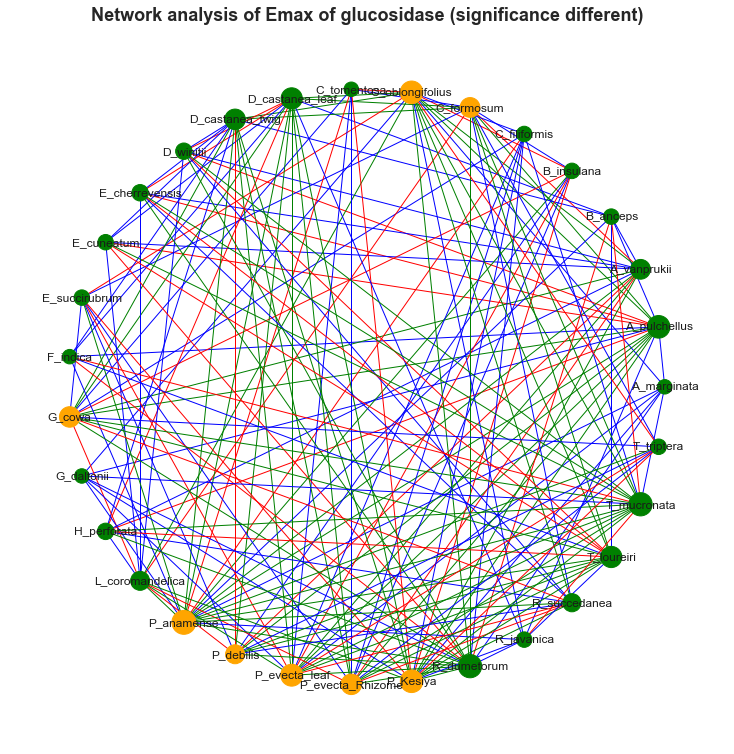

In [279]:
# draw improved graph
sns.set(rc={'figure.figsize': (10, 10)})
font_dict = {'fontsize': 18}

nx.draw(Gx, pos=nx.circular_layout(Gx), with_labels=True,
        node_size=node_size, node_color=color_map, edge_color=edge_colours, alpha=1)

plt.title("Network analysis of Emax of glucosidase (significance different)", fontdict=font_dict, weight='bold')
plt.savefig('Network_glucosidase_sig_P_0_05', dpi=300)
plt.show()

In [280]:
def assign_colour(P):
    if P > 0.01 and P <= 0.05:
        return "blue"  
    elif P > 0.001 and P <= 0.01:
        return "red"  
    elif P <= 0.001:
        return "green"  
    else:
        return "black"

edge_colours_all = []

for key, value in nx.get_edge_attributes(G0, 'P').items():
    edge_colours_all.append(assign_colour(value))


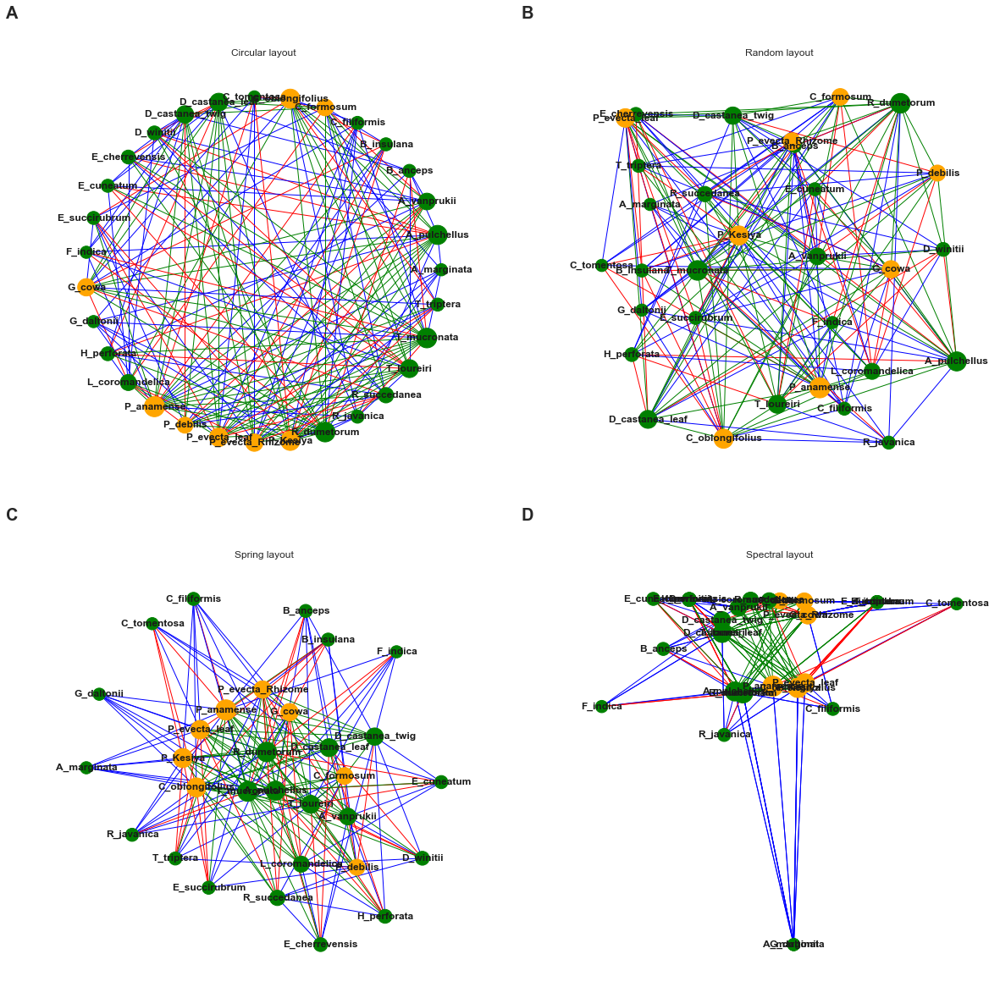

In [281]:

fig, ax = plt.subplots(nrows=2, ncols=2,figsize=(20,20))

texts = ['A', 'B', 'C', 'D']
axes = fig.get_axes()
for a,l in zip(axes, texts):
    a.annotate(l, xy=(-0.1, 1.1), xycoords="axes fraction", fontsize=20, weight = 'bold')

nx.draw(Gx, with_labels=True, node_size=node_size,  node_color=color_map, edge_color=edge_colours,  pos=nx.circular_layout(Gx),ax=ax[0,0], font_weight='bold')
ax[0,0].set_title("Circular layout")

nx.draw(Gx, with_labels=True, node_size=node_size,  node_color=color_map, edge_color=edge_colours,   pos=nx.random_layout(Gx),ax=ax[0,1], font_weight='bold')
ax[0,1].set_title("Random layout")

nx.draw(Gx, with_labels=True, node_size=node_size,  node_color=color_map, edge_color=edge_colours,   pos=nx.spring_layout(Gx),ax=ax[1,0], font_weight='bold')
ax[1,0].set_title("Spring layout")

nx.draw(Gx, with_labels=True, node_size=node_size,  node_color=color_map, edge_color=edge_colours,   pos=nx.spectral_layout(Gx),ax=ax[1,1], font_weight='bold')
ax[1,1].set_title("Spectral layout")


plt.savefig('Network_glucosidase_signigficance', dpi=300)
plt.show()

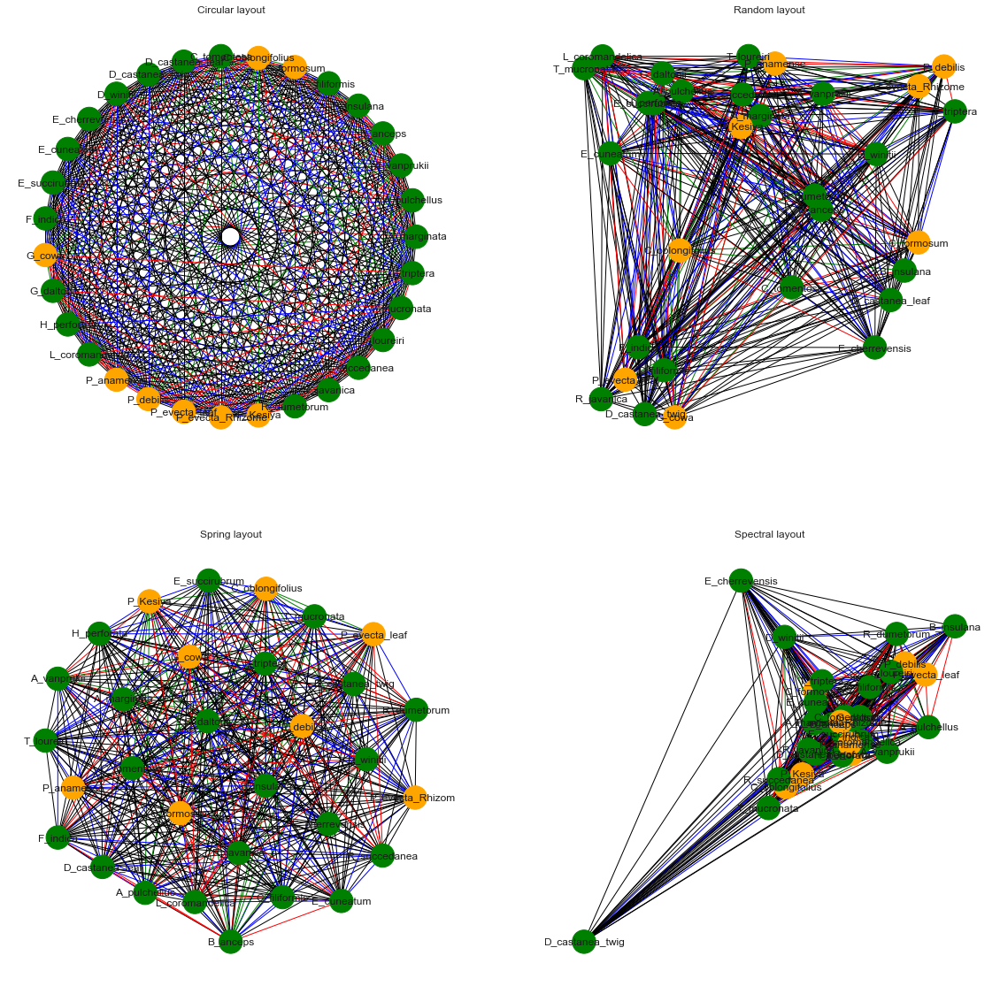

In [159]:

fig, ax = plt.subplots(nrows=2, ncols=2,figsize=(20,20))

nx.draw(G0, with_labels=True, node_size=700,  node_color=color_map, edge_color=edge_colours_all,  pos=nx.circular_layout(G0),ax=ax[0,0])
ax[0,0].set_title("Circular layout")

nx.draw(G0, with_labels=True, node_size=700,  node_color=color_map, edge_color=edge_colours_all,   pos=nx.random_layout(G0),ax=ax[0,1])
ax[0,1].set_title("Random layout")

nx.draw(G0, with_labels=True, node_size=700,  node_color=color_map, edge_color=edge_colours_all,   pos=nx.spring_layout(G0),ax=ax[1,0])
ax[1,0].set_title("Spring layout")

nx.draw(G0, with_labels=True, node_size=700,  node_color=color_map, edge_color=edge_colours_all,   pos=nx.spectral_layout(G0),ax=ax[1,1])
ax[1,1].set_title("Spectral layout")


plt.savefig('Network_glucisidase_all', dpi=300)
plt.show()

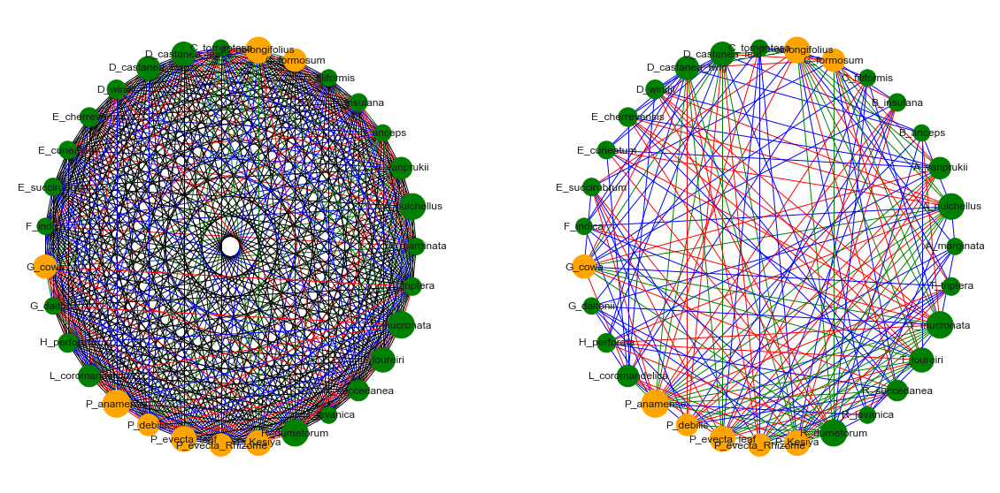

In [163]:
fig, ax = plt.subplots(nrows=1, ncols=2,figsize=(20,10))

nx.draw(G0, with_labels=True, node_size=node_size,  node_color=color_map, edge_color=edge_colours_all,  pos=nx.circular_layout(G0), ax=ax[0])
nx.draw(Gx, with_labels=True, node_size=node_size,  node_color=color_map, edge_color=edge_colours,  pos=nx.circular_layout(Gx), ax=ax[1])

plt.savefig('Network_glucosidase_circular_all', dpi=300)
plt.show()

In [98]:
df_amylase = pd.read_csv('Result_Emax_amylase_posthoc_dunn.csv')

In [100]:
df_amylase.head()

,Unnamed: 0,chi2,Z,P,P.adjusted,comparitor_1,comparitor_2
0,1,91.632532,-0.272276,0.392705,0.392705,A_marginata,A_pulchellus
1,2,91.632532,-0.461357,0.322271,0.322271,A_marginata,A_vanprukii
2,3,91.632532,-0.189081,0.425015,0.425015,A_pulchellus,A_vanprukii
3,4,91.632532,0.136138,0.445856,0.445856,A_marginata,B_anceps
4,5,91.632532,0.408414,0.341485,0.341485,A_pulchellus,B_anceps


In [102]:
dfa = df_amylase[['comparitor_1', 'comparitor_2','Z','P']]
#remove self correlations
dfa = dfa.loc[df['comparitor_1'] != df['comparitor_2']].copy()

In [141]:
#create undirected graph with weights corresponding to the correlation magnitude
Ga = nx.from_pandas_edgelist(dfa, 'comparitor_1', 'comparitor_2', edge_attr=['P'])

#print out the graph info
#check number of nodes and degrees are as expected (all should have degree = 38, i.e. average degree = 38)
print(nx.info(Ga))

Graph with 31 nodes and 465 edges


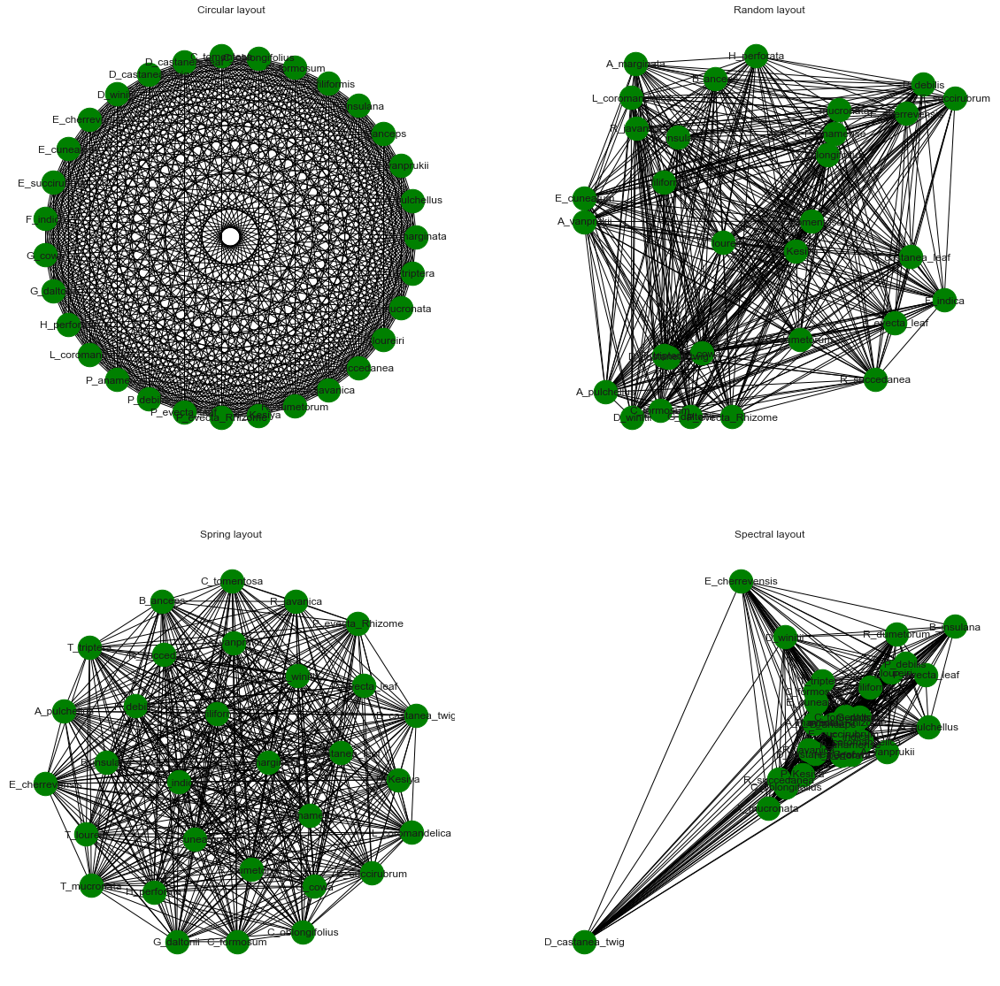

In [142]:
fig, ax = plt.subplots(nrows=2, ncols=2,figsize=(20,20))

nx.draw(Ga, with_labels=True, node_size=700, node_color="green",
        edge_color='black',  pos=nx.circular_layout(G0),ax=ax[0,0])
ax[0,0].set_title("Circular layout")

nx.draw(Ga, with_labels=True, node_size=700, node_color="green",
        edge_color='black',  pos=nx.random_layout(G0),ax=ax[0,1])
ax[0,1].set_title("Random layout")

nx.draw(Ga, with_labels=True, node_size=700, node_color="green",
        edge_color='black',  pos=nx.spring_layout(G0),ax=ax[1,0])
ax[1,0].set_title("Spring layout")

nx.draw(Ga, with_labels=True, node_size=700, node_color="green",
        edge_color='black',  pos=nx.spectral_layout(G0),ax=ax[1,1])
ax[1,1].set_title("Spectral layout")

plt.show()

In [147]:
# 'winner takes all' method - set minium correlation threshold to remove some edges from the diagram
threshold = 0.05

# create a new graph from edge list
Gxa = nx.from_pandas_edgelist(dfa, 'comparitor_1', 'comparitor_2', edge_attr=['P'])

# list to store edges to remove
remove = []
# loop through edges in Gx and find correlations which are below the threshold
for comparitor_1, comparitor_2 in Gxa.edges():
    P = Gxa[comparitor_1][comparitor_2]['P']
    #add to remove node list if abs(corr) < threshold
    if P > threshold:
        remove.append((comparitor_1, comparitor_2))

# remove edges contained in the remove list
Gxa.remove_edges_from(remove)

print(str(len(remove)) + " edges removed")

288 edges removed


In [182]:
def assign_colour(P):
    if P > 0.01 and P <= 0.05:
        return "blue"  
    elif P > 0.001 and P <= 0.01:
        return "red"  
    elif P <= 0.001:
        return "green"  
    else:
        return "black"


def assign_thickness(P, benchmark_thickness=10, scaling_factor=5):
    return benchmark_thickness * abs(P)**scaling_factor


def assign_node_size(degree, scaling_factor=30):
    return degree * scaling_factor


# assign colours to edges depending on positive or negative correlation
# assign edge thickness depending on magnitude of correlation
edge_colours_a = []
edge_width_a = []
for key, value in nx.get_edge_attributes(Gxa, 'P').items():
    edge_colours_a.append(assign_colour(value))
    edge_width_a.append(assign_thickness(value))

# assign node size depending on number of connections (degree)
node_size_a = []
for key, value in dict(Gxa.degree).items():
    node_size_a.append(assign_node_size(value))
#color by IC50
color_map_a = []
for node in G0:
    if node in {'G_cowa', 'P_debilis', 'P_evecta_leaf', 'E_cuneatum', 'E_cherrevensis', 'F_indica', 'P_Kesiya', 'R_javanica', 'C_formosum', 'D_castanea_leaf'
                , 'T_mucronata', 'D_winitii', 'B_insulana'}:
        color_map_a.append('orange')
    else: 
        color_map_a.append('green') 

In [165]:
def assign_colour(P):
    if P > 0.01 and P <= 0.05:
        return "blue"  
    elif P > 0.001 and P <= 0.01:
        return "red"  
    elif P <= 0.001:
        return "green"  
    else:
        return "black"

edge_colours_all_a = []

for key, value in nx.get_edge_attributes(Ga, 'P').items():
    edge_colours_all_a.append(assign_colour(value))


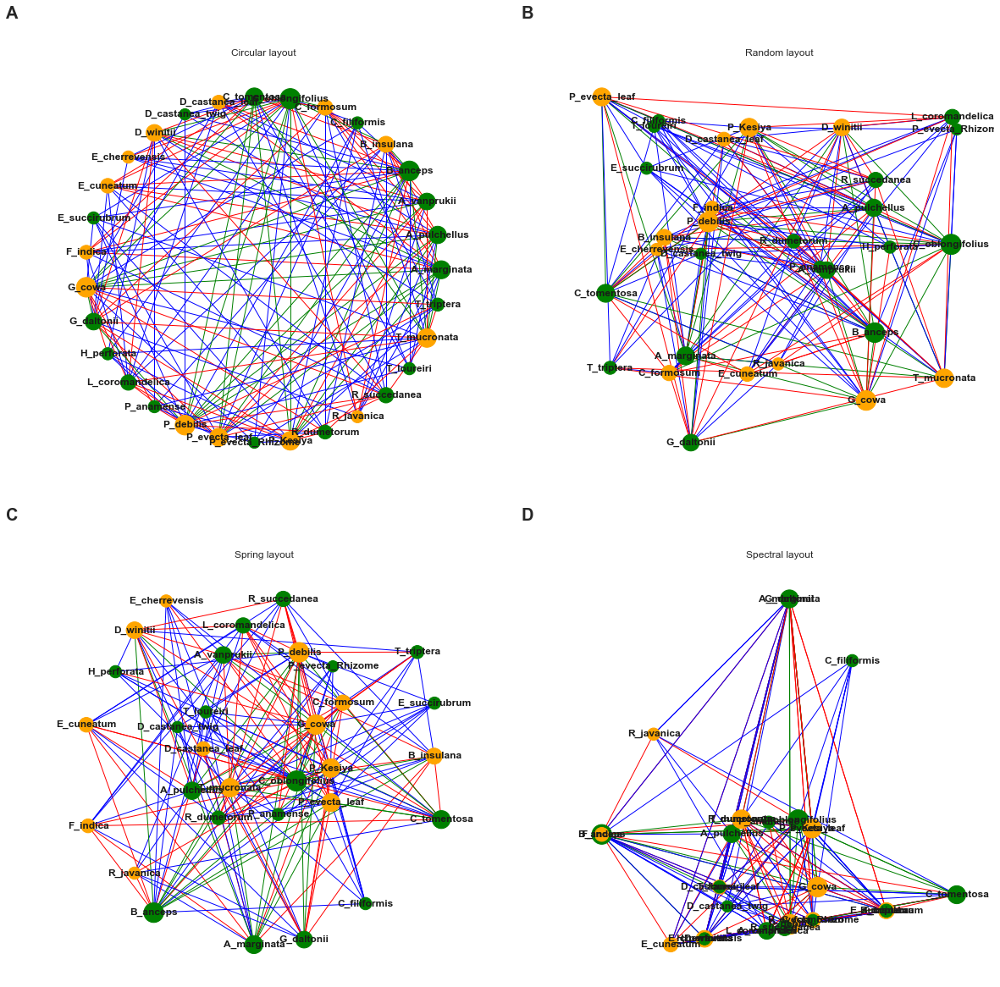

In [227]:

fig, ax = plt.subplots(nrows=2, ncols=2,figsize=(20,20))

texts = ['A', 'B', 'C', 'D']
axes = fig.get_axes()
for a,l in zip(axes, texts):
    a.annotate(l, xy=(-0.1, 1.1), xycoords="axes fraction", fontsize=20, weight = 'bold')

nx.draw(Gxa, with_labels=True, node_size=node_size_a,  node_color=color_map_a, edge_color=edge_colours_a,  pos=nx.circular_layout(Gx),ax=ax[0,0], font_weight='bold')
ax[0,0].set_title("Circular layout")

nx.draw(Gxa, with_labels=True, node_size=node_size_a,  node_color=color_map_a, edge_color=edge_colours_a,   pos=nx.random_layout(Gx),ax=ax[0,1], font_weight='bold')
ax[0,1].set_title("Random layout")

nx.draw(Gxa, with_labels=True, node_size=node_size_a,  node_color=color_map_a, edge_color=edge_colours_a,   pos=nx.spring_layout(Gx),ax=ax[1,0], font_weight='bold')
ax[1,0].set_title("Spring layout")

nx.draw(Gxa, with_labels=True, node_size=node_size_a,  node_color=color_map_a, edge_color=edge_colours_a,   pos=nx.spectral_layout(Gx),ax=ax[1,1], font_weight='bold')
ax[1,1].set_title("Spectral layout")


plt.savefig('Network_amylase_signigficance', dpi=300)
plt.show()

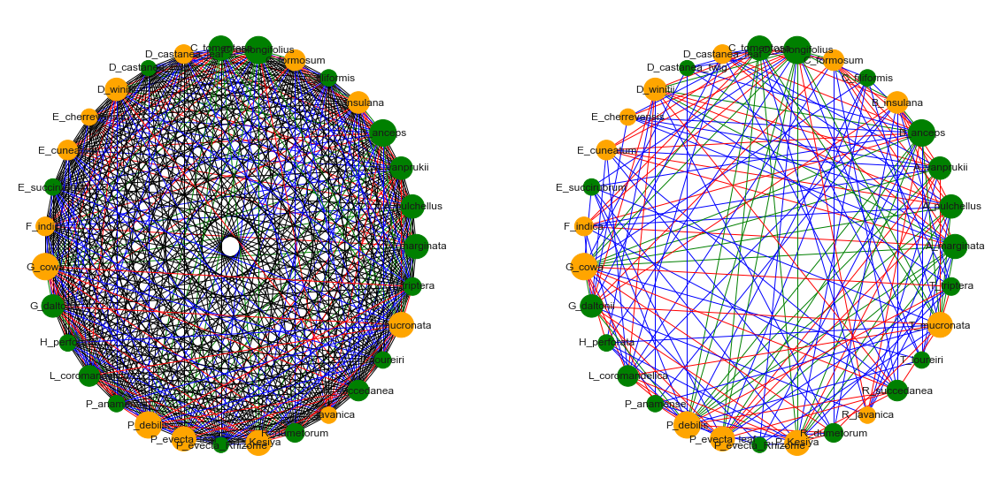

In [166]:
fig, ax = plt.subplots(nrows=1, ncols=2,figsize=(20,10))

nx.draw(Ga, with_labels=True, node_size=node_size_a,  node_color=color_map_a, edge_color=edge_colours_all_a,  pos=nx.circular_layout(Ga), ax=ax[0])
nx.draw(Gxa, with_labels=True, node_size=node_size_a,  node_color=color_map_a, edge_color=edge_colours_a,  pos=nx.circular_layout(Gxa), ax=ax[1])

plt.savefig('Network_amylase_circular_all', dpi=300)
plt.show()

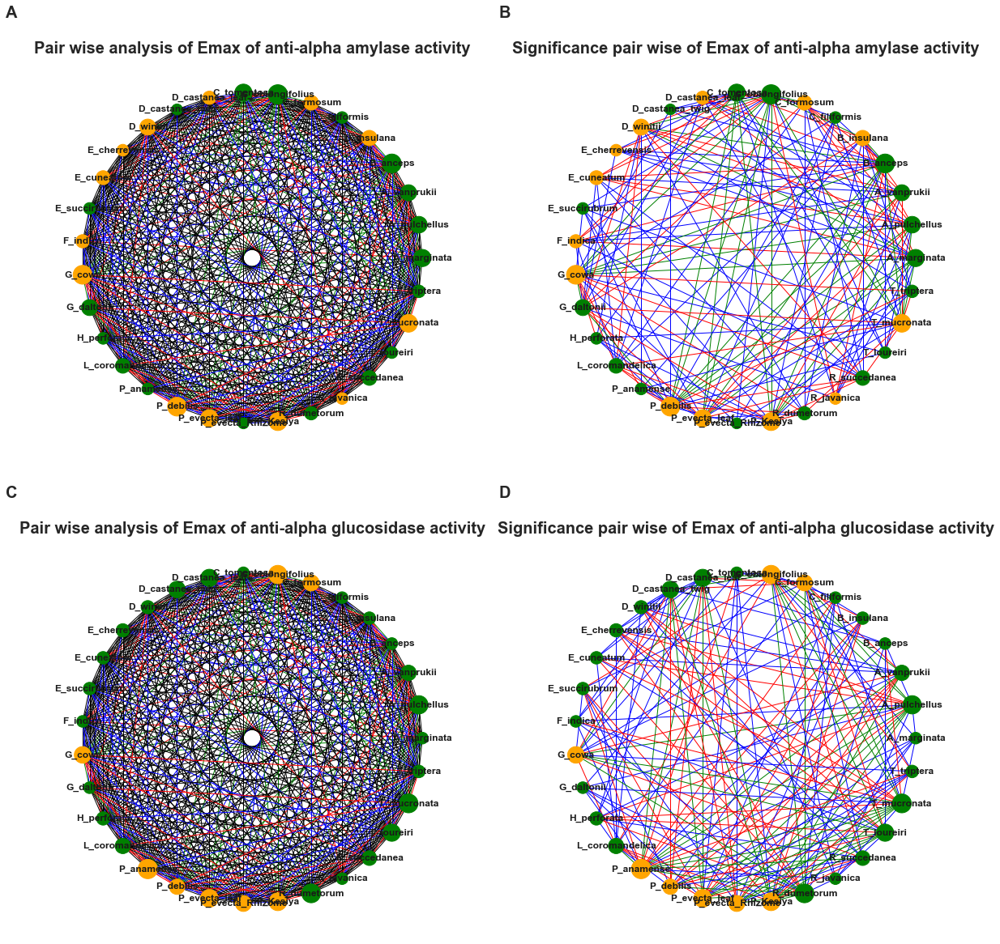

In [197]:
fig, ax = plt.subplots(nrows=2, ncols=2,figsize=(20,20))


texts = ['A', 'B', 'C', 'D']
axes = fig.get_axes()
for a,l in zip(axes, texts):
    a.annotate(l, xy=(-0.1, 1.1), xycoords="axes fraction", fontsize=20, weight = 'bold')
    

nx.draw(Ga, with_labels=True, node_size=node_size_a,  node_color=color_map_a, edge_color=edge_colours_all_a,  pos=nx.circular_layout(Ga), ax=ax[0,0], font_weight='bold')
nx.draw(Gxa, with_labels=True, node_size=node_size_a,  node_color=color_map_a, edge_color=edge_colours_a,  pos=nx.circular_layout(Gxa), ax=ax[0,1], font_weight='bold')

nx.draw(G0, with_labels=True, node_size=node_size,  node_color=color_map, edge_color=edge_colours_all,  pos=nx.circular_layout(G0), ax=ax[1,0], font_weight='bold')
nx.draw(Gx, with_labels=True, node_size=node_size,  node_color=color_map, edge_color=edge_colours,  pos=nx.circular_layout(Gx), ax=ax[1,1], font_weight='bold')

ax[0,0].set_title("Pair wise analysis of Emax of anti-alpha amylase activity", weight='bold', fontsize=20)
ax[0,1].set_title("Significance pair wise of Emax of anti-alpha amylase activity", weight='bold', fontsize=20)
ax[1,0].set_title("Pair wise analysis of Emax of anti-alpha glucosidase activity", weight='bold', fontsize=20)
ax[1,1].set_title("Significance pair wise of Emax of anti-alpha glucosidase activity", weight='bold', fontsize=20)


plt.savefig('Network_circular_all', dpi=300)
plt.show()

In [228]:
IC_a = pd.read_csv('Result_IC50_amylase_posthoc_dunn.csv')
IC_a

,Unnamed: 0,chi2,Z,P,P.adjusted,comparitor_1,comparitor_2
0,1,36.65641,-0.680309,0.248154,0.248154,B_insulana,C_formosum
1,2,36.65641,-0.107417,0.457229,0.457229,B_insulana,D_castanea_leaf
2,3,36.65641,0.572892,0.283359,0.283359,C_formosum,D_castanea_leaf
3,4,36.65641,2.255762,0.012043,0.012043,B_insulana,D_winitii
4,5,36.65641,2.936071,0.001662,0.001662,C_formosum,D_winitii
...,...,...,...,...,...,...,...
73,74,36.65641,-1.360618,0.086817,0.086817,G_cowa,T_mucronata
74,75,36.65641,-0.465475,0.320796,0.320796,P_debilis,T_mucronata
75,76,36.65641,-0.966755,0.166833,0.166833,P_evecta_leaf,T_mucronata
76,77,36.65641,-2.005122,0.022475,0.022475,P_Kesiya,T_mucronata


In [229]:
IC_a = IC_a[['comparitor_1', 'comparitor_2','Z','P']]

In [230]:
IC_a.head()

,comparitor_1,comparitor_2,Z,P
0,B_insulana,C_formosum,-0.680309,0.248154
1,B_insulana,D_castanea_leaf,-0.107417,0.457229
2,C_formosum,D_castanea_leaf,0.572892,0.283359
3,B_insulana,D_winitii,2.255762,0.012043
4,C_formosum,D_winitii,2.936071,0.001662


In [231]:
#create undirected graph with weights corresponding to the correlation magnitude
ICa = nx.from_pandas_edgelist(IC_a, 'comparitor_1', 'comparitor_2', edge_attr=['P'])
#print out the graph info
print(nx.info(ICa))

Graph with 13 nodes and 78 edges


In [232]:
edge_colours_all_ICa = []

for key, value in nx.get_edge_attributes(ICa, 'P').items():
    edge_colours_all_ICa.append(assign_colour(value))


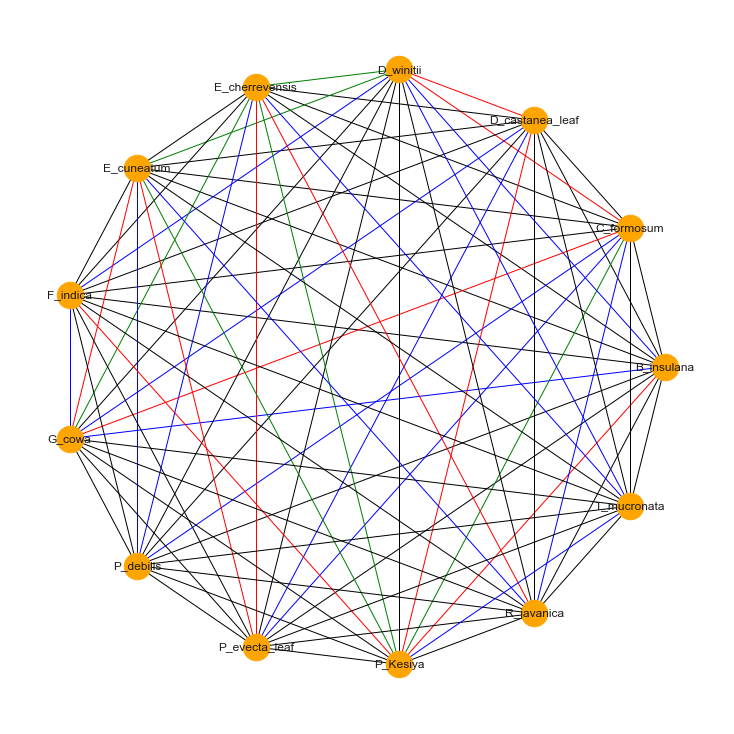

In [235]:
nx.draw(ICa, pos=nx.circular_layout(ICa), with_labels=True, node_size=700, node_color='orange',
        edge_color=edge_colours_all_ICa)

In [237]:
# 'winner takes all' method - set minium correlation threshold to remove some edges from the diagram
threshold = 0.05

# create a new graph from edge list
ICa_x = nx.from_pandas_edgelist(IC_a, 'comparitor_1', 'comparitor_2', edge_attr=['P'])

# list to store edges to remove
remove = []
# loop through edges in Gx and find correlations which are below the threshold
for comparitor_1, comparitor_2 in ICa_x.edges():
    P = ICa_x[comparitor_1][comparitor_2]['P']
    #add to remove node list if abs(corr) < threshold
    if P > threshold:
        remove.append((comparitor_1, comparitor_2))

# remove edges contained in the remove list
ICa_x.remove_edges_from(remove)

print(str(len(remove)) + " edges removed")


47 edges removed


In [240]:
# assign colours to edges depending on positive or negative correlation
# assign edge thickness depending on magnitude of correlation
edge_colours_ICa_x = []
edge_width_ICa_x = []
for key, value in nx.get_edge_attributes(ICa_x, 'P').items():
    edge_colours_ICa_x.append(assign_colour(value))
    edge_width_ICa_x.append(assign_thickness(value))

# assign node size depending on number of connections (degree)
node_size_ICa_x = []
for key, value in dict(ICa_x.degree).items():
    node_size_ICa_x.append(assign_node_size(value))
#color by IC50
color_map_ICa_x = []
for node in Gia:
    if node in {'G_cowa', 'P_debilis', 'P_evecta_leaf', 'E_cuneatum', 'E_cherrevensis', 'F_indica', 'P_Kesiya', 'R_javanica', 'C_formosum', 'D_castanea_leaf',
                'T_mucronata', 'D_winitii', 'B_insulana'}:
        color_map_ICa_x.append('orange')
    else: 
        color_map_ICa_x.append('green') 

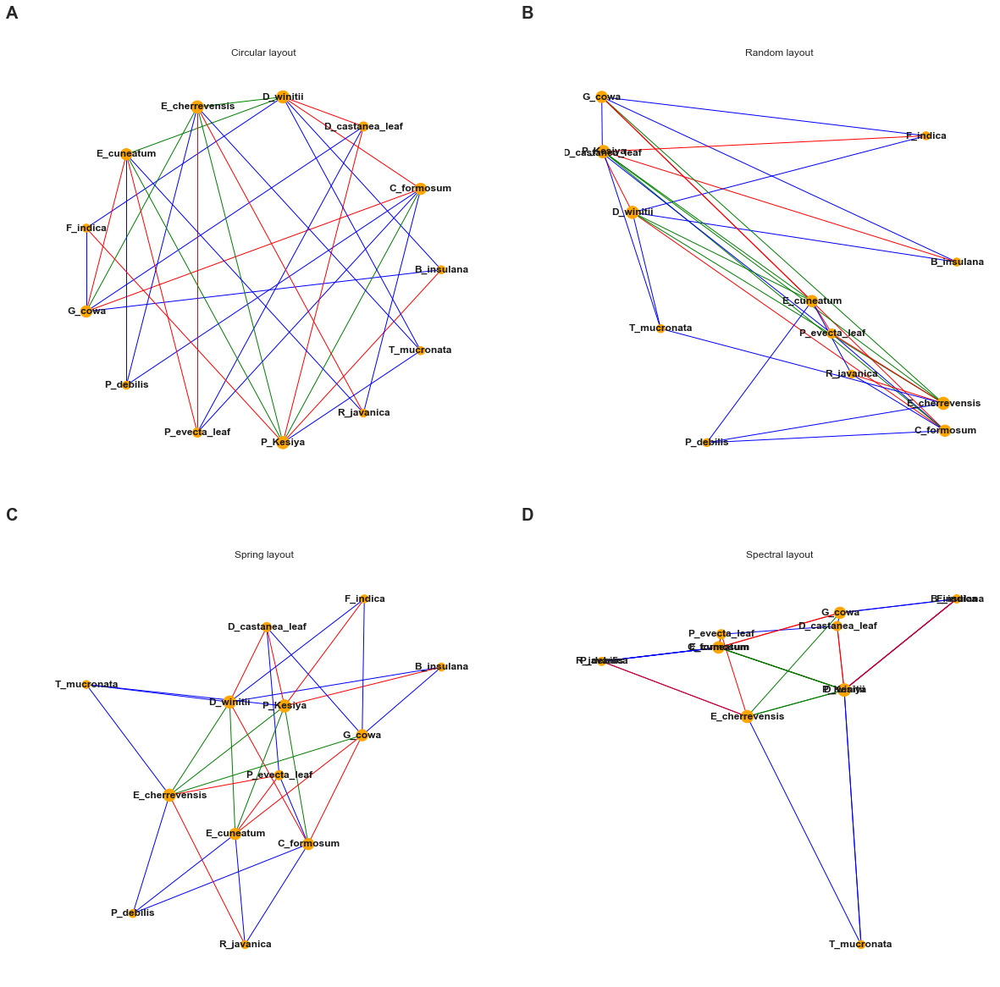

In [250]:

fig, ax = plt.subplots(nrows=2, ncols=2,figsize=(20,20))

texts = ['A', 'B', 'C', 'D']
axes = fig.get_axes()
for a,l in zip(axes, texts):
    a.annotate(l, xy=(-0.1, 1.1), xycoords="axes fraction", fontsize=20, weight = 'bold')

nx.draw(ICa_x, with_labels=True, node_size=node_size_ICa_x,  node_color=color_map_ICa_x, edge_color=edge_colours_ICa_x,  pos=nx.circular_layout(ICa_x),ax=ax[0,0], font_weight='bold')
ax[0,0].set_title("Circular layout")

nx.draw(ICa_x, with_labels=True, node_size=node_size_ICa_x,  node_color=color_map_ICa_x, edge_color=edge_colours_ICa_x,   pos=nx.random_layout(ICa_x),ax=ax[0,1], font_weight='bold')
ax[0,1].set_title("Random layout")

nx.draw(ICa_x, with_labels=True, node_size=node_size_ICa_x,  node_color=color_map_ICa_x, edge_color=edge_colours_ICa_x,   pos=nx.spring_layout(ICa_x),ax=ax[1,0], font_weight='bold')
ax[1,0].set_title("Spring layout")

nx.draw(ICa_x, with_labels=True, node_size=node_size_ICa_x,  node_color=color_map_ICa_x, edge_color=edge_colours_ICa_x,   pos=nx.spectral_layout(ICa_x),ax=ax[1,1], font_weight='bold')
ax[1,1].set_title("Spectral layout")


plt.savefig('Network_amylase_signigficance_IC50_x', dpi=300)
plt.show()

In [245]:
IC_g = pd.read_csv('Result_IC50_glucosidase_posthoc_dunn.csv')
IC_g = IC_g[['comparitor_1', 'comparitor_2','Z','P']]
#create undirected graph with weights corresponding to the correlation magnitude
ICg = nx.from_pandas_edgelist(IC_g, 'comparitor_1', 'comparitor_2', edge_attr=['P'])
#print out the graph info
print(nx.info(ICg))

Graph with 8 nodes and 28 edges


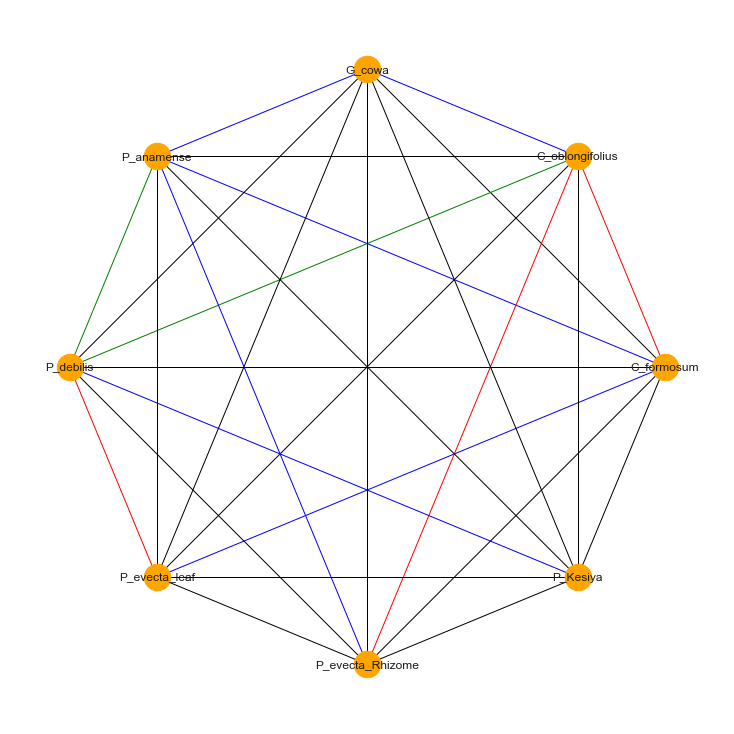

In [247]:
edge_colours_all_ICg = []

for key, value in nx.get_edge_attributes(ICg, 'P').items():
    edge_colours_all_ICg.append(assign_colour(value))
nx.draw(ICg, pos=nx.circular_layout(ICg), with_labels=True, node_size=700, node_color='orange',
        edge_color=edge_colours_all_ICg)

In [251]:
# 'winner takes all' method - set minium correlation threshold to remove some edges from the diagram
threshold = 0.05

# create a new graph from edge list
ICg_x = nx.from_pandas_edgelist(IC_g, 'comparitor_1', 'comparitor_2', edge_attr=['P'])

# list to store edges to remove
remove = []
# loop through edges in Gx and find correlations which are below the threshold
for comparitor_1, comparitor_2 in ICg_x.edges():
    P = ICg_x[comparitor_1][comparitor_2]['P']
    #add to remove node list if abs(corr) < threshold
    if P > threshold:
        remove.append((comparitor_1, comparitor_2))

# remove edges contained in the remove list
ICg_x.remove_edges_from(remove)

print(str(len(remove)) + " edges removed")


17 edges removed


In [254]:
# assign colours to edges depending on positive or negative correlation
# assign edge thickness depending on magnitude of correlation
edge_colours_ICg_x = []
edge_width_ICg_x = []
for key, value in nx.get_edge_attributes(ICg_x, 'P').items():
    edge_colours_ICg_x.append(assign_colour(value))
    edge_width_ICg_x.append(assign_thickness(value))

# assign node size depending on number of connections (degree)
node_size_ICg_x = []
for key, value in dict(ICg_x.degree).items():
    node_size_ICg_x.append(assign_node_size(value))
#color by IC50
color_map_ICg_x = []
for node in ICg_x:
    if node in {'G_cowa', 'P_debilis', 'P_evecta_leaf', 'P_evecta_Rhizome', 'P_anamense', 'P_Kesiya', 'C_formosum', 'C_oblongifolius'}:
        color_map_ICg_x.append('orange')
    else: 
        color_map_ICg_x.append('green') 

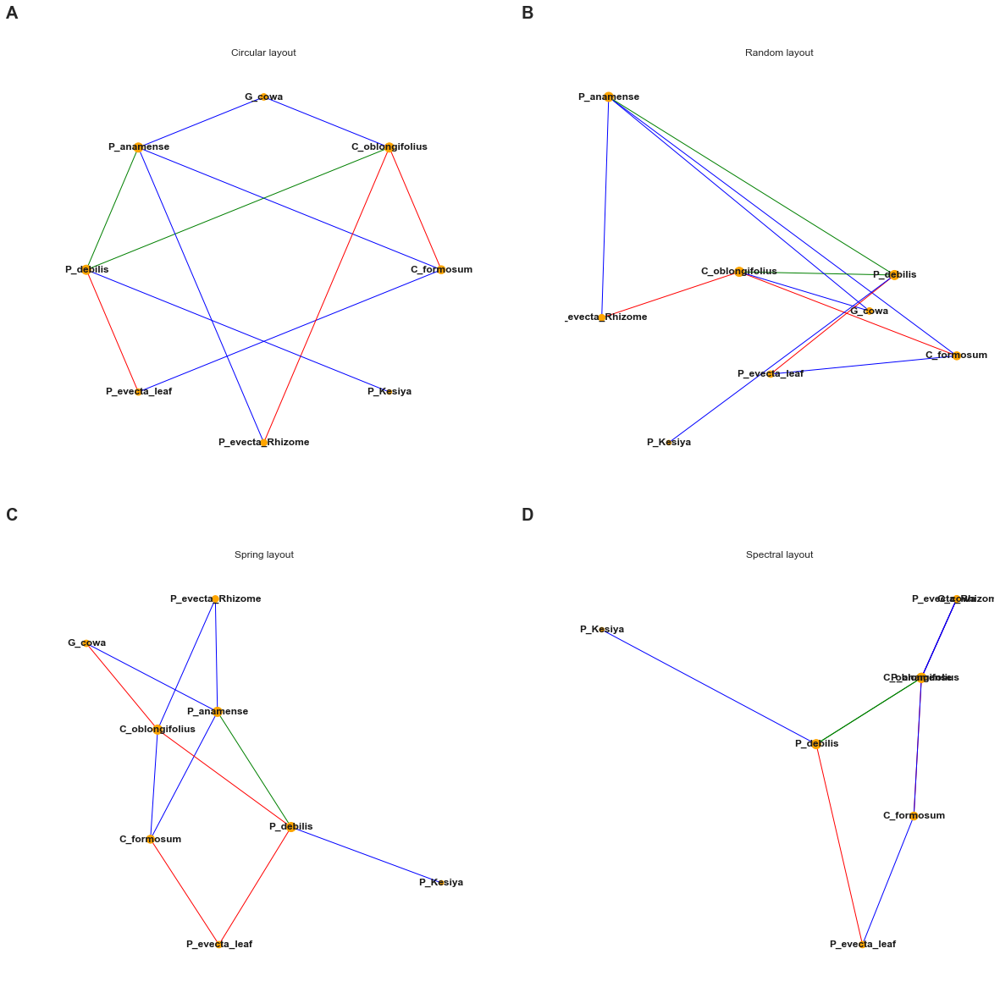

In [288]:
fig, ax = plt.subplots(nrows=2, ncols=2,figsize=(20,20))

texts = ['A', 'B', 'C', 'D']
axes = fig.get_axes()
for a,l in zip(axes, texts):
    a.annotate(l, xy=(-0.1, 1.1), xycoords="axes fraction", fontsize=20, weight = 'bold')

nx.draw(ICg_x, with_labels=True, node_size=node_size_ICg_x,  node_color=color_map_ICg_x, edge_color=edge_colours_ICg_x,  pos=nx.circular_layout(ICg_x),ax=ax[0,0], font_weight='bold')
ax[0,0].set_title("Circular layout")

nx.draw(ICg_x, with_labels=True, node_size=node_size_ICg_x,  node_color=color_map_ICg_x, edge_color=edge_colours_ICg_x,   pos=nx.random_layout(ICg_x),ax=ax[0,1], font_weight='bold')
ax[0,1].set_title("Random layout")

nx.draw(ICg_x, with_labels=True, node_size=node_size_ICg_x,  node_color=color_map_ICg_x, edge_color=edge_colours_ICa_x,   pos=nx.spring_layout(ICg_x),ax=ax[1,0], font_weight='bold')
ax[1,0].set_title("Spring layout")

nx.draw(ICg_x, with_labels=True, node_size=node_size_ICg_x,  node_color=color_map_ICg_x, edge_color=edge_colours_ICg_x,   pos=nx.spectral_layout(ICg_x),ax=ax[1,1], font_weight='bold')
ax[1,1].set_title("Spectral layout")


plt.savefig('Network_glucodase_signigficance_IC50_x', dpi=300)
plt.show()

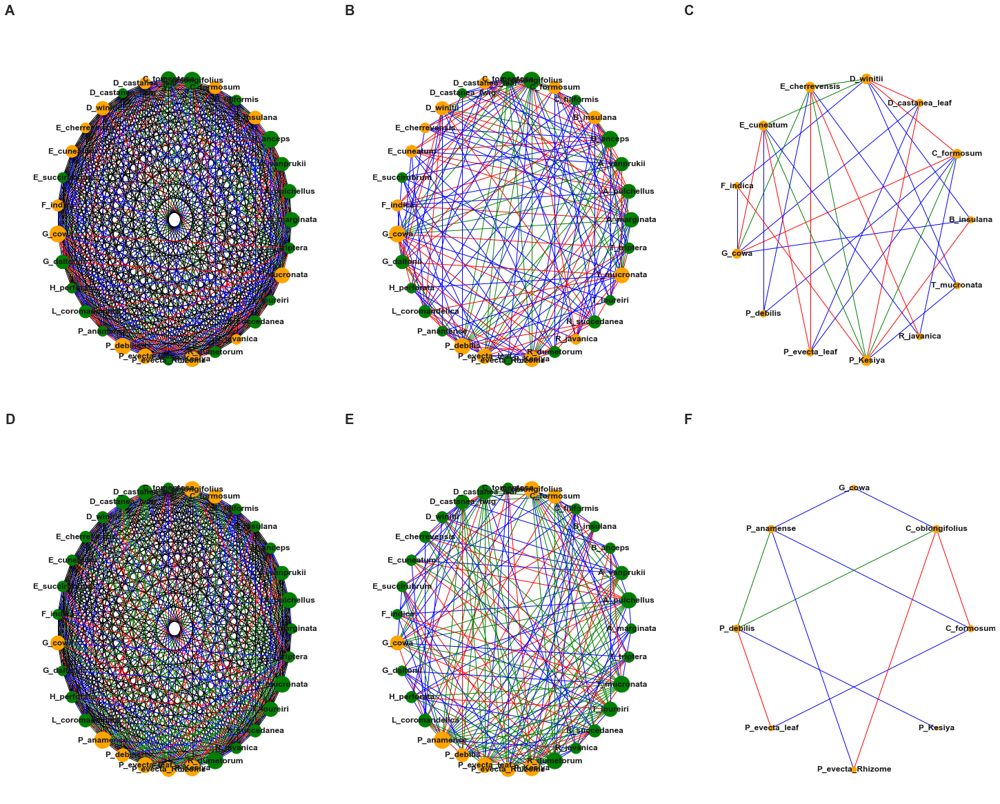

In [290]:
fig, ax = plt.subplots(nrows=2, ncols=3,figsize=(25,20))


texts = ['A', 'B', 'C', 'D', 'E', 'F']
axes = fig.get_axes()
for a,l in zip(axes, texts):
    a.annotate(l, xy=(-0.1, 1.1), xycoords="axes fraction", fontsize=20, weight = 'bold')
    

nx.draw(Ga, with_labels=True, node_size=node_size_a,  node_color=color_map_a, edge_color=edge_colours_all_a,  pos=nx.circular_layout(Ga), ax=ax[0,0], font_weight='bold')
nx.draw(Gxa, with_labels=True, node_size=node_size_a,  node_color=color_map_a, edge_color=edge_colours_a,  pos=nx.circular_layout(Gxa), ax=ax[0,1], font_weight='bold')
nx.draw(ICa_x, with_labels=True, node_size=node_size_ICa_x,  node_color=color_map_ICa_x, edge_color=edge_colours_ICa_x,  pos=nx.circular_layout(ICa_x),ax=ax[0,2], font_weight='bold')
nx.draw(G0, with_labels=True, node_size=node_size,  node_color=color_map, edge_color=edge_colours_all,  pos=nx.circular_layout(G0), ax=ax[1,0], font_weight='bold')
nx.draw(Gx, with_labels=True, node_size=node_size,  node_color=color_map, edge_color=edge_colours,  pos=nx.circular_layout(Gx), ax=ax[1,1], font_weight='bold')
nx.draw(ICg_x, with_labels=True, node_size=node_size_ICg_x,  node_color=color_map_ICg_x, edge_color=edge_colours_ICg_x,  pos=nx.circular_layout(ICg_x),ax=ax[1,2], font_weight='bold')
#ax[0,0].set_title("Pairwise comparison of Emax of anti-α amylase activity", weight='bold', fontsize=12)
#ax[0,1].set_title("Significance pairwise comparison of Emax of anti-α amylase activity", weight='bold', fontsize=12)
#ax[0,2].set_title("Significance pairwise comparison of IC50 of anti-α amylase activity", weight='bold', fontsize=12)
#ax[1,0].set_title("Pairwise comparison of Emax of anti-α glucosidase activity", weight='bold', fontsize=12)
#ax[1,1].set_title("Significance pairwise of Emax of anti-α glucosidase activity", weight='bold', fontsize=12)
#ax[1,2].set_title("Significance pairwise of IC50 of anti-α glucosidase activity", weight='bold', fontsize=12)

plt.savefig('Network_circular_Emax_IC50.pdf', dpi=300)
plt.show()